In [2]:
# GENDER AGENDAS MAPPER
# V3 - July 2025
# Developed by the Gender Justice Data Hub
# CC BY-NC-SA 4.0, Global Fund for Women

In [4]:
# Uninstall everything related
!pip uninstall -y torch torchvision torchaudio transformers sentence-transformers bertopic umap-learn hdbscan accelerate bitsandbytes xformers

# Clear pip cache
!pip cache purge

# First install PyTorch with CUDA
!pip install torch==2.6.0 torchvision==0.21.0 torchaudio==2.6.0 --index-url https://download.pytorch.org/whl/cu124

# Then the base dependencies
!pip install transformers==4.35.2 accelerate bitsandbytes

# Install sentence-transformers before BERTopic
!pip install sentence-transformers

# Finally install BERTopic and its dependencies
!pip install bertopic umap-learn hdbscan adjustText

Found existing installation: torch 2.2.2
Uninstalling torch-2.2.2:
  Successfully uninstalled torch-2.2.2
Found existing installation: transformers 4.53.2
Uninstalling transformers-4.53.2:
  Successfully uninstalled transformers-4.53.2
Found existing installation: sentence-transformers 5.0.0
Uninstalling sentence-transformers-5.0.0:
  Successfully uninstalled sentence-transformers-5.0.0
Found existing installation: bertopic 0.17.3
Uninstalling bertopic-0.17.3:
  Successfully uninstalled bertopic-0.17.3
Found existing installation: umap-learn 0.5.9.post2
Uninstalling umap-learn-0.5.9.post2:
  Successfully uninstalled umap-learn-0.5.9.post2
Found existing installation: hdbscan 0.8.40
Uninstalling hdbscan-0.8.40:
  Successfully uninstalled hdbscan-0.8.40
Found existing installation: accelerate 1.8.1
Uninstalling accelerate-1.8.1:
  Successfully uninstalled accelerate-1.8.1
Found existing installation: bitsandbytes 0.42.0
Uninstalling bitsandbytes-0.42.0:
  Successfully uninstalled bitsand

In [5]:
!pip install openai --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 765.0/765.0 kB 8.8 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: openai
    Found existing installation: openai 1.96.0
    Uninstalling openai-1.96.0:
      Successfully uninstalled openai-1.96.0


In [8]:
!pip install polars-lts-cpu

In [10]:
import pandas as pd
import re
from sklearn.feature_extraction.text import CountVectorizer

import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

from bertopic import BERTopic
print("BERTopic imported successfully")

from sentence_transformers import SentenceTransformer
print("SentenceTransformers is working")

from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance

import openai

PyTorch version: 2.2.2
CUDA available: False


<frozen importlib._bootstrap>:241: RuntimeWarning: pyarrow.lib.IpcReadOptions size changed, may indicate binary incompatibility. Expected 96 from C header, got 104 from PyObject


BERTopic imported successfully
SentenceTransformers is working


In [11]:
import pandas as pd
import re
import torch
from sklearn.feature_extraction.text import CountVectorizer
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN

import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords

from bertopic import BERTopic
from bertopic.representation import OpenAI, KeyBERTInspired, MaximalMarginalRelevance

# Load API key from .env
from dotenv import load_dotenv
import os
import openai

load_dotenv()
openai.api_key = os.getenv("OPENAI_API_KEY")

print("Packages loaded successfully.")

Packages loaded successfully.


[nltk_data] Downloading package stopwords to /Users/Condi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [16]:
import openai
from dotenv import load_dotenv
import os

# Load API key from .env file
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")

# Create OpenAI client for v1.x
client = openai.OpenAI(api_key=api_key)

# Load topic representation
from bertopic.representation import OpenAI as OpenAI_Representation

representation_model = OpenAI_Representation(
    client=client,
    model="gpt-4o",
    delay_in_seconds=10
)

# Prompt
prompt = """
I have a topic that contains the following documents: [DOCUMENTS]
The topic is described by the following keywords: [KEYWORDS]
Based on the information above, extract a short topic label in the following format:
topic: <topic label>
"""

In [20]:
import pandas as pd

file_list = [
    "Input/gender_Apr25-1.csv"
]

# Read and convert date without filtering
dfs = []
for f in file_list:
    df_temp = pd.read_csv(f)
    df_temp["event_date"] = pd.to_datetime(df_temp["event_date"])
    dfs.append(df_temp)

# Concatenate all DataFrames
df = pd.concat(dfs, ignore_index=True)

In [22]:
print("Number of rows after filtering:", len(df))
print("Dates:", df["event_date"].min(), "→", df["event_date"].max())

Number of rows after filtering: 84118
Dates: 1997-01-06 00:00:00 → 2025-04-25 00:00:00


In [24]:
import polars as pl

pl_df = pl.from_pandas(df)
pl_df

event_id_cnty,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,civilian_targeting,iso,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp
str,datetime[ns],i64,i64,str,str,str,str,str,str,str,str,str,str,str,i64,str,str,str,str,str,str,f64,f64,i64,str,str,str,i64,str,i64
"""ARG16601""",2025-04-25 00:00:00,2025,1,"""Demonstrations""","""Protests""","""Peaceful protest""","""Protesters (Argentina)""","""Women (Argentina)""","""Protesters""",null,null,null,"""Protesters only""",null,32,"""South America""","""Argentina""","""Cordoba""","""Punilla""",null,"""Capilla del Monte""",-30.8568,-64.5258,1,"""El Diario de Carlos Paz""","""Subnational""","""On 25 April 2025, in Capilla d…",0,"""crowd size=large""",1745881584
"""BRA96908""",2025-04-25 00:00:00,2025,2,"""Political violence""","""Violence against civilians""","""Attack""","""CV: Red Command""",null,"""Political militia""","""Civilians (Brazil)""","""Women (Brazil)""","""Civilians""","""Political militia-Civilians""","""Civilian targeting""",76,"""South America""","""Brazil""","""Bahia""","""Salvador""",null,"""Salvador""",-12.9711,-38.5108,1,"""Alo Juca; Bnews (Brazil)""","""Subnational-National""","""Around 25 April 2025 (as repor…",1,"""women targeted: girls""",1745881585
"""ISR45719""",2025-04-25 00:00:00,2025,1,"""Demonstrations""","""Protests""","""Peaceful protest""","""Protesters (Israel)""","""Shift 101; Women (Israel)""","""Protesters""",null,null,null,"""Protesters only""",null,376,"""Middle East""","""Israel""","""Jerusalem""","""Jerusalem""","""Judean Mountains""","""Jerusalem""",31.769,35.2163,1,"""Haaretz""","""National""","""On 25 April 2025, about 200 Is…",0,"""crowd size=about 200""",1745881590
"""MEX103000""",2025-04-25 00:00:00,2025,1,"""Political violence""","""Violence against civilians""","""Attack""","""Unidentified Armed Group (Mexi…",null,"""Political militia""","""Civilians (Mexico)""","""Labor Group (Mexico); Women (M…","""Civilians""","""Political militia-Civilians""","""Civilian targeting""",484,"""North America""","""Mexico""","""Guanajuato""","""Leon""",null,"""Leon de los Aldama""",21.122,-101.6832,1,"""Zona Franca""","""Subnational""","""On 25 April 2025, in Leon de l…",1,null,1745881592
"""MEX103223""",2025-04-25 00:00:00,2025,1,"""Political violence""","""Violence against civilians""","""Attack""","""Unidentified Gang (Mexico)""",null,"""Political militia""","""Civilians (Mexico)""","""Women (Mexico)""","""Civilians""","""Political militia-Civilians""","""Civilian targeting""",484,"""North America""","""Mexico""","""Veracruz de Ignacio de la Llav…","""Coxquihui""",null,"""Sabanas de Xalostoc""",20.2216,-97.5349,1,"""Imagen del Golfo""","""Subnational""","""On 25 April 2025, in Sabanas d…",2,"""women targeted: relatives of t…",1745881593
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""UGA13""",1997-03-05 00:00:00,1997,2,"""Political violence""","""Violence against civilians""","""Attack""","""LRA: Lords Resistance Army""",null,"""Rebel group""","""Civilians (Uganda)""","""Women (Uganda)""","""Civilians""","""Rebel group-Civilians""","""Civilian targeting""",800,"""Eastern Africa""","""Uganda""","""Lamwo""","""Lamwo""","""Palabek Kal""","""Palabek""",3.4333,32.5667,1,"""New York Times""","""International""","""After failing to find deserter…",9,"""women targeted: girls""",1667868656
"""ALG50""",1997-02-24 00:00:00,1997,1,"""Political violence""","""Violence against civilians""","""Attack""","""GIA: Armed Islamic Group""",null,"""Rebel group""","""Civilians (Algeria)""","""Women (Algeria)""","""Civilians""","""Rebel group-Civilians""","""Civilian targeting""",12,"""Northern Africa""","""Algeria""","""Medea""","""Berrouaghia""",null,"""Berrouaghia""",36.1352,2.9109,1,"""Algeria Watch""","""Other""","""24 March: 5 young girls were k…",5,"""women targeted: girls""",16

In [26]:
import polars as pl
import pandas as pd
import re

# Get unique list of places and create the pattern
place_cols = ["country", "location", "admin1", "admin2", "admin3"]
place_series = [pl_df[col].drop_nulls().unique() for col in place_cols]
places = set()
for s in place_series:
    places.update(s.to_list())

places = [l.strip() for l in places if isinstance(l, str)]
pattern = r'\b(' + '|'.join(map(re.escape, places)) + r')\b'

# Apply cleaning directly in Polars
pl_df_clean = pl_df.with_columns(
    pl.col("notes")
      .cast(pl.String)
      .str.replace_all(pattern, "")
      .str.replace_all(r"\b(19|20)\d{2}\b", "")
      .alias("notes_clean")
)

# Extract the final list
documents = pl_df_clean["notes_clean"].drop_nulls().to_list()

In [28]:
titles = df["event_id_cnty"].dropna().tolist()

In [30]:
import pandas as pd
import polars as pl

def glimpse_polars(df: pl.DataFrame, max_cols=100, max_rows=5):
    
    print(f"Observations: {df.height:,}")
    print(f"Variables: {df.width:,}")
    print("-" * 100)

    col_info = []
    for i, col_name in enumerate(df.columns):
        if i < max_cols:
            col_series = df.get_column(col_name)
            dtype = col_series.dtype
            non_null_count = col_series.len() - col_series.null_count()
            unique_count = col_series.n_unique()
            
            sample_values = col_series.drop_nulls().unique().slice(0, max_rows).to_list()

            col_info.append({
                "Variable": col_name,
                "Type": dtype,
                "Non-Null": f"{non_null_count:,}",
                "Unique": f"{unique_count:,}",
                "Sample Values": sample_values
            })

    col_info_df = pd.DataFrame(col_info)
    print(col_info_df.to_string(index=False, max_colwidth=100))

    if df.width > max_cols:
        print(f"\n... and {df.width - max_cols} more variables")
    print("-" * 100)

glimpse_polars(pl_df_clean)

Observations: 84,118
Variables: 32
----------------------------------------------------------------------------------------------------
          Variable                                     Type Non-Null Unique                                                                                        Sample Values
     event_id_cnty                                   String   84,118 84,118                                                      [SWE6397, ARG3600, FRA20469, CAN3752, ITA14805]
        event_date Datetime(time_unit='ns', time_zone=None)   84,118  5,331 [1997-01-06 00:00:00, 1997-01-15 00:00:00, 1997-01-22 00:00:00, 1997-02-24 00:00:00, 1997-03-05 0...
              year                                    Int64   84,118     29                                                                       [1997, 1998, 1999, 2000, 2001]
    time_precision                                    Int64   84,118      3                                                                                 

In [32]:
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, OpenAI

# Embeddings
embedding_model = SentenceTransformer("all-mpnet-base-v2")
embeddings = embedding_model.encode(documents, show_progress_bar=True)

# UMAP for dimensionality reduction (5D for clustering)
umap_model = UMAP(
    n_neighbors=40,
    n_components=5,
    min_dist=0.4,
    metric='cosine',
    random_state=42
)

# HDBSCAN for clustering
hdbscan_model = HDBSCAN(
    min_cluster_size=40,
    min_samples=15,
    metric='euclidean',
    cluster_selection_method='eom',
    prediction_data=True
)

# Dimensionality reduction for visualization (2D)
reduced_embeddings = UMAP(
    n_neighbors=15,
    n_components=2,
    min_dist=0.0,
    metric='cosine',
    random_state=42
).fit_transform(embeddings)

# Stopwords and vectorization
stopwords_total = set(stopwords.words("spanish") + stopwords.words("english"))
vectorizer_model = CountVectorizer(stop_words=list(stopwords_total))

# Semantic representations
representation_model = {
    "KeyBERT": KeyBERTInspired(),
    "MMR": MaximalMarginalRelevance(diversity=0.3),
    "OpenAI": OpenAI(
        client=client,
        model="gpt-4o",
        prompt=prompt
    )
}

Batches:   0%|          | 0/2629 [00:00<?, ?it/s]

In [34]:
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    representation_model=representation_model,
    top_n_words=10,
    verbose=True
)

# Fit the model and transform the documents
topics, probs = topic_model.fit_transform(documents, embeddings)

2025-07-16 14:45:57,349 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-07-16 14:47:41,683 - BERTopic - Dimensionality - Completed ✓
2025-07-16 14:47:41,684 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

     Topic  Count                                       Name  \
0       -1  40496               -1_women_group_protest_march   
1        0   1364              0_found_body_wrapped_fatality   
2        1   1152   1_ransom_abducted_kidnapped_unidentified   
3        2   1121          2_conference_press_picketed_urged   
4        3   1006             3_femicide_justice_case_demand   
..     ...    ...                                        ...   
261    260     40   260_conversions_aurat_marriages_enforced   
262    261     40      261_japanese_weekly_apology_wednesday   
263    262     40            262_bigger_50th_roe_anniversary   
264    263     40  263_autism_children_simeonov_disabilities   
265    264     40    264_hijab_religious_sociopolitical_veil   

                                        Representation  \
0    [women, group, protest, march, members, woman,...   
1    [found, body, wrapped, fatality, colonia, tied...   
2    [ransom, abducted, kidnapped, unidentified, ar...   

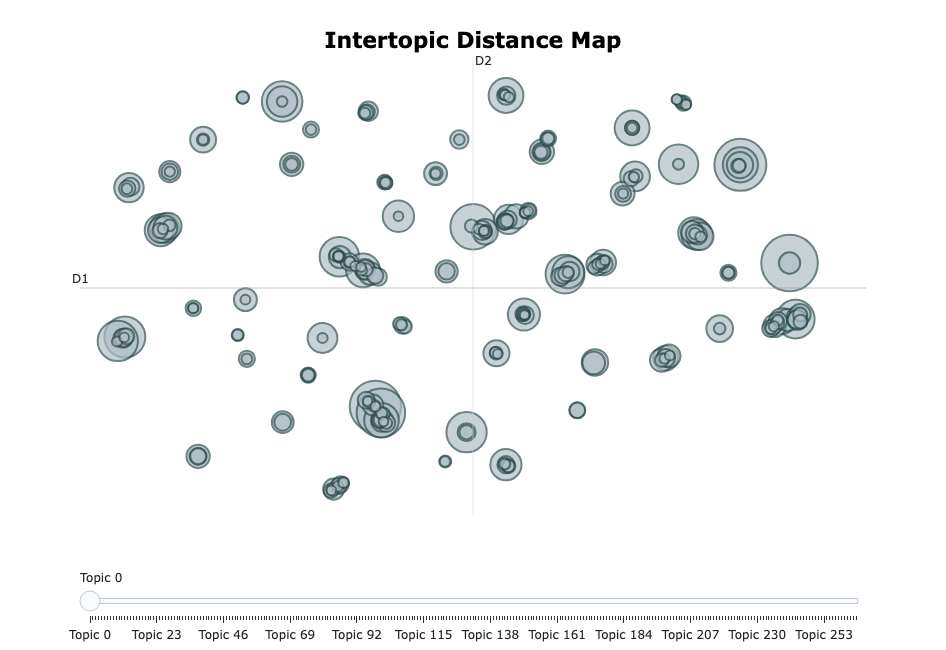

In [38]:
# Basic topic information
print(topic_model.get_topic_info())

# Keywords of a specific topic
print(topic_model.get_topic(0))

# Visualization
topic_model.visualize_topics()

In [40]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,MMR,OpenAI,Representative_Docs
0,-1,40496,-1_women_group_protest_march,"[women, group, protest, march, members, woman,...","[protested, protesters, protest, demonstrators...","[group, protest, march, woman, violence, polic...",[Protests Against Gender-Based Violence and Wo...,"[On 3 July , community members marched in (, ..."
1,0,1364,0_found_body_wrapped_fatality,"[found, body, wrapped, fatality, colonia, tied...","[strangled, decapitated, dismembered, beheaded...","[found, wrapped, fatality, colonia, plastic, t...",[Femicide and Body Disposal Patterns in Urban ...,"[Around 3 April (as reported), in , , a woman..."
2,1,1152,1_ransom_abducted_kidnapped_unidentified,"[ransom, abducted, kidnapped, unidentified, ar...","[kidnapped, kidnappers, kidnapping, abductions...","[ransom, abducted, kidnapped, unidentified, na...",[Kidnappings and Ransom Demands by Armed Groups],"[On 5 March , unidentified armed men abducted ..."
3,2,1121,2_conference_press_picketed_urged,"[conference, press, picketed, urged, korean, s...","[picketed, pickets, solidarity, discrimination...","[press, picketed, seoul, banners, harassment, ...",[Gender Equality and Anti-Discrimination Prote...,"[On 4 September , protesters, including local ..."
4,3,1006,3_femicide_justice_case_demand,"[femicide, justice, case, demand, friends, fem...","[protested, protesters, protest, victims, acti...","[justice, cases, victims, feminist, victim, co...",[Protests Demanding Justice for Femicide Victims],"[On 10 January , in , , about 100 people, incl..."
...,...,...,...,...,...,...,...,...
261,260,40,260_conversions_aurat_marriages_enforced,"[conversions, aurat, marriages, enforced, mini...","[protest, march, wage, wages, demonstration, w...","[marriages, enforced, increase, march, demandi...",[Women's Rights and Demonstrations in Pakistan],"[On 8 March , women held a demonstration durin..."
262,261,40,261_japanese_weekly_apology_wednesday,"[japanese, weekly, apology, wednesday, comfort...","[reconciliation, seoul, participants, embassy,...","[japanese, apology, wednesday, comfort, embass...",[Comfort Women Protests at Former Japanese Emb...,"[On 7 February , participants held signs and b..."
263,262,40,262_bigger_50th_roe_anniversary,"[bigger, 50th, roe, anniversary, coincide, wad...","[protesters, protests, demonstrators, abortion...","[roe, january, commemorate, 51st, abortion, pr...",[Nationwide 'Bigger than Roe' Protests on Roe ...,"[On 22 January , an unreported number of peopl..."
264,263,40,263_autism_children_simeonov_disabilities,"[autism, children, simeonov, disabilities, aut...","[protested, disabilities, mothers, children, a...","[autism, disabilities, valeri, insulting, parl...",[Protests Against Valeri Simeonov over Insulti...,"[On 28 November , mothers of children with dis..."


In [42]:
openai_topics = topic_model.get_topics(full=True)["OpenAI"]

for topic_id, label_info in openai_topics.items():
    label = label_info[0][0].split("\n")[0]
    print(f"Topic {topic_id:>2}: {label}")

Topic -1: Protests Against Gender-Based Violence and Women's Rights Advocacy
Topic  0: Femicide and Body Disposal Patterns in Urban Areas
Topic  1: Kidnappings and Ransom Demands by Armed Groups
Topic  2: Gender Equality and Anti-Discrimination Protests in South Korea
Topic  3: Protests Demanding Justice for Femicide Victims
Topic  4: Protests and Riots Over Mahsa Amini's Death
Topic  5: Abortion Rights Protests Following Overturning of Roe v. Wade
Topic  6: Anganwadi Workers' Protests for Regularization and Increased Wages
Topic  7: Global Demonstrations for Abortion Legalization on September 28
Topic  8: Nationwide Flower Demonstrations in Support of MeToo Movement Against Sexual Violence
Topic  9: Suppression of Petitioners and Rights Defenders During Political Conventions in China
Topic 10: Political Protests by BJP and BJP Mahila Morcha Against INC and AIMC Actions
Topic 11: Sexual Violence in Darfur by Militias and RSF
Topic 12: Drive-by Shootings Involving Motorcycles and Female

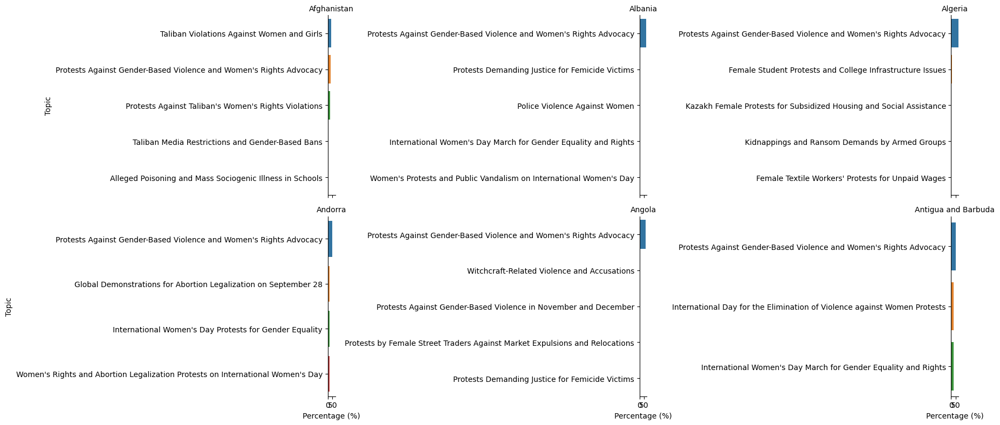

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Convert only necessary columns to pandas, preserving order
df_plot = pl_df_clean.select(["country", "notes_clean"]).drop_nulls().to_pandas()

# Ensure the length matches the number of topics
assert len(df_plot) == len(topics), "❌ 'topics' length does not match the cleaned documents."

# Assign topics to cleaned documents
df_doc_topics = pd.DataFrame({
    "country": df_plot["country"].values,
    "topic": topics
})

# Count topics per country
topic_counts = df_doc_topics.groupby(["country", "topic"]).size().reset_index(name="count")

# Relative percentage per country
topic_counts["total_country"] = topic_counts.groupby("country")["count"].transform("sum")
topic_counts["percentage"] = 100 * topic_counts["count"] / topic_counts["total_country"]

# Get topic labels
openai_topics = topic_model.get_topics(full=True)["OpenAI"]
labels_df = pd.DataFrame([
    {"topic": topic_id, "label": label_info[0][0].split("\n")[0]}
    for topic_id, label_info in openai_topics.items()
])

# Merge with labels
topic_counts["topic"] = topic_counts["topic"].astype(int)
labels_df["topic"] = labels_df["topic"].astype(int)
topic_counts = topic_counts.merge(labels_df, on="topic", how="left")

# Top-N topics per country
top_n = 5
top_topics_per_country = topic_counts.sort_values(["country", "percentage"], ascending=[True, False])\
                                     .groupby("country").head(top_n)

# Limit to only 3 countries
countries_to_plot = top_topics_per_country["country"].drop_duplicates().sort_values().head(6)
top_topics_per_country = top_topics_per_country[top_topics_per_country["country"].isin(countries_to_plot)]

# Plot with Seaborn
g = sns.FacetGrid(
    top_topics_per_country,
    col="country",
    col_wrap=3,
    sharey=False,
    height=4,
    aspect=1.5
)

g.map_dataframe(
    sns.barplot,
    x="percentage",
    y="label",
    palette="tab10"
)

g.set_titles(col_template="{col_name}")
g.set_axis_labels("Percentage (%)", "Topic")
for ax in g.axes.flatten():
    for label in ax.get_yticklabels():
        label.set_rotation(0)

plt.tight_layout()
plt.show()

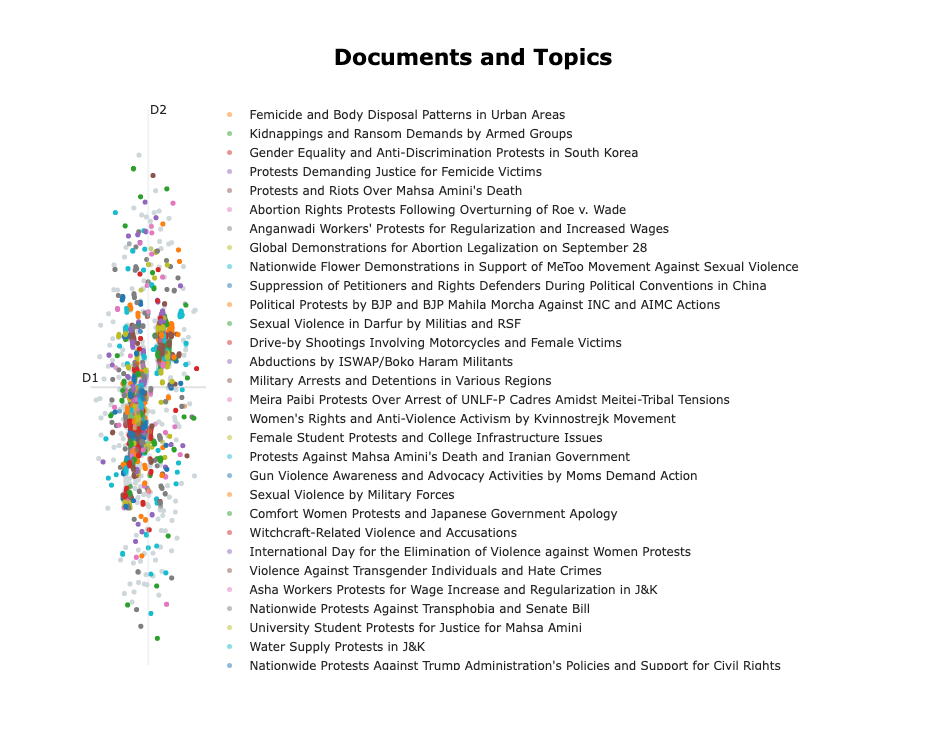

In [46]:
openai_labels = [
    label[0][0].split("\n")[0]
    for label in topic_model.get_topics(full=True)["OpenAI"].values()
]

topic_model.set_topic_labels(openai_labels)

topic_model.visualize_documents(titles, reduced_embeddings=reduced_embeddings, hide_annotations=True, hide_document_hover=False, custom_labels=True)

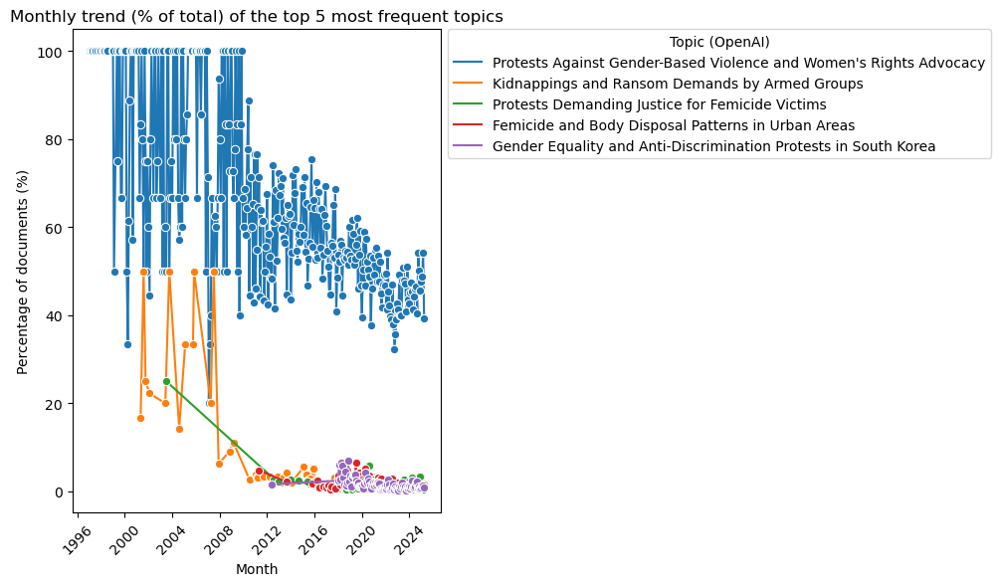

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Convert required columns from Polars
df_plot = pl_df_clean.select(["event_date", "notes_clean"]).drop_nulls().to_pandas()
df_plot["event_date"] = pd.to_datetime(df_plot["event_date"])

# Validate topic length
assert len(df_plot) == len(topics), "❌ Length of 'topics' does not match cleaned documents."

# Create DataFrame of topics per document
df_doc_topics = pd.DataFrame({
    "event_date": df_plot["event_date"].values,
    "topic": topics
})

# Add month column
df_doc_topics["month"] = df_doc_topics["event_date"].dt.to_period("M").dt.to_timestamp()

# Group by month and topic
monthly_topic_counts = df_doc_topics.groupby(["month", "topic"]).size().reset_index(name="count")

# Calculate percentage within each month
monthly_topic_counts["monthly_total"] = monthly_topic_counts.groupby("month")["count"].transform("sum")
monthly_topic_counts["percentage"] = 100 * monthly_topic_counts["count"] / monthly_topic_counts["monthly_total"]

# Get topic labels from the model
openai_topics = topic_model.get_topics(full=True)["OpenAI"]
labels_df = pd.DataFrame([
    {"topic": topic_id, "label": label_info[0][0].split("\n")[0]}
    for topic_id, label_info in openai_topics.items()
])
labels_df["topic"] = labels_df["topic"].astype(int)
monthly_topic_counts["topic"] = monthly_topic_counts["topic"].astype(int)
monthly_topic_counts = monthly_topic_counts.merge(labels_df, on="topic", how="left")

# Select top-N global topics by volume
top_n = 5
top_topics = (
    monthly_topic_counts.groupby("topic")["count"]
    .sum()
    .nlargest(top_n)
    .index.tolist()
)
df_top = monthly_topic_counts[monthly_topic_counts["topic"].isin(top_topics)]

# Monthly percentage line plot
plt.figure(figsize=(12, 6))
ax = sns.lineplot(data=df_top, x="month", y="percentage", hue="label", marker="o")

plt.legend(title="Topic (OpenAI)", bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.title(f"Monthly trend (% of total) of the top {top_n} most frequent topics")
plt.xlabel("Month")
plt.ylabel("Percentage of documents (%)")
plt.xticks(rotation=45)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()

In [50]:
import itertools
import pandas as pd

# Define colors for the visualization to iterate over
colors = itertools.cycle(['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000'])
color_key = {str(topic): next(colors) for topic in set(topic_model.topics_) if topic != -1}

# Prepare dataframe and ignore outliers
dfo = pd.DataFrame({"x": reduced_embeddings[:, 0], "y": reduced_embeddings[:, 1], "Topic": [str(t) for t in topic_model.topics_]})
dfo["Length"] = [len(doc) for doc in documents]
dfo = dfo.loc[dfo.Topic != "-1"]
dfo = dfo.loc[(dfo.y > -10) & (dfo.y < 10) & (dfo.x < 10) & (dfo.x > -10), :]
dfo["Topic"] = dfo["Topic"].astype("category")

# Get centroids of clusters
mean_df = dfo.groupby("Topic").mean().reset_index()
mean_df.Topic = mean_df.Topic.astype(int)
mean_df = mean_df.sort_values("Topic")

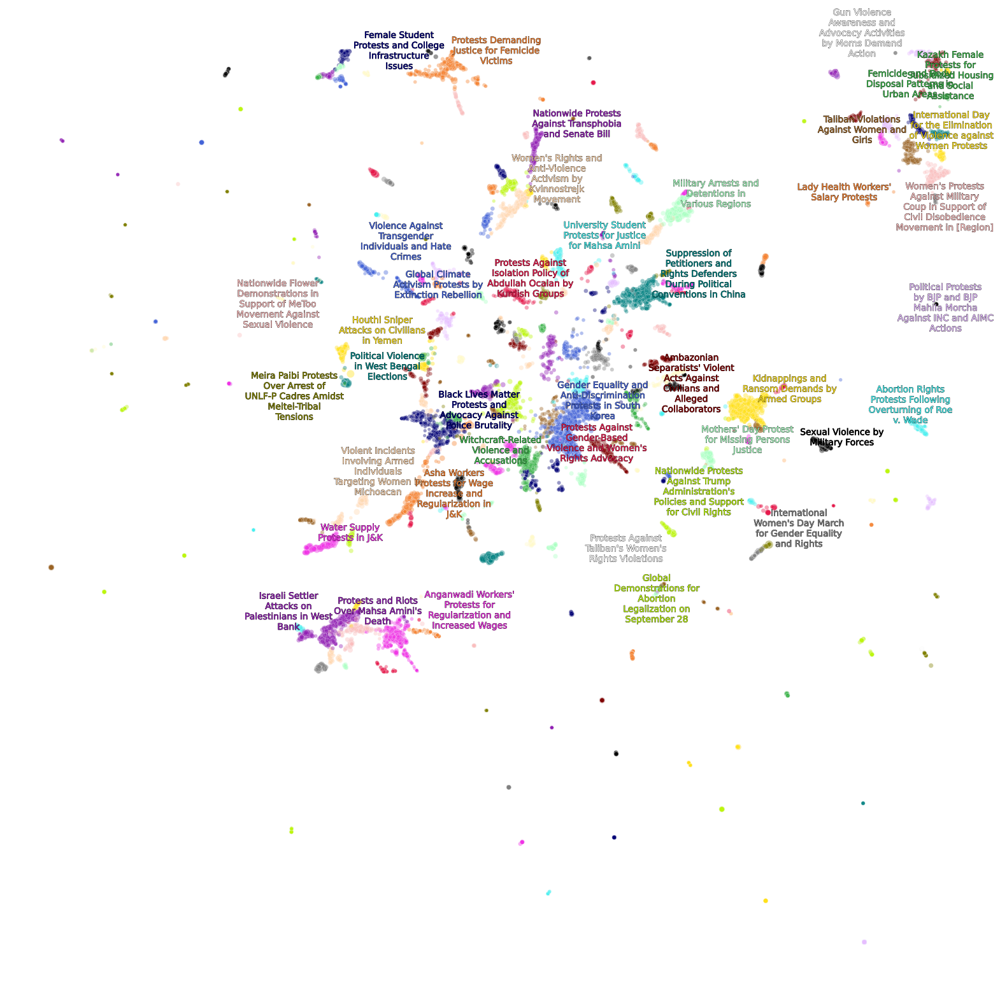

In [52]:
import seaborn as sns
from matplotlib import pyplot as plt
from adjustText import adjust_text
import matplotlib.patheffects as pe
import textwrap

fig = plt.figure(figsize=(20, 20))
sns.scatterplot(
    data=dfo,
    x='x',
    y='y',
    hue='Topic',
    palette=color_key,
    alpha=0.4,
    size='Length',
    sizes=(10, 200),
    legend=False
)

# Annotate top 50 topics
texts, xs, ys = [], [], []
for row in mean_df.iterrows():
  topic = row[1]["Topic"]
  name = textwrap.fill(topic_model.custom_labels_[int(topic)], 20)
  if int(topic) <= 50:
    xs.append(row[1]["x"])
    ys.append(row[1]["y"])
    texts.append(plt.text(row[1]["x"], row[1]["y"], name, size=10, ha="center", color=color_key[str(int(topic))],
                          path_effects=[pe.withStroke(linewidth=0.5, foreground="black")]
                          ))

# Adjust annotations such that they do not overlap
adjust_text(texts, x=xs, y=ys, time_lim=1, force_text=(0.01, 0.02), force_static=(0.01, 0.02), force_pull=(0.5, 0.5))
plt.axis('off')
plt.legend('', frameon=False)
plt.show()

In [62]:
# Extract required data
df_plot = pl_df_clean.select(["event_date", "country", "notes_clean"]).drop_nulls().to_pandas()
df_plot["event_date"] = pd.to_datetime(df_plot["event_date"])

# Validate length
assert len(df_plot) == len(topics), "❌ Length of topics does not match the documents."

# Create base DataFrame
df_doc_topics = pd.DataFrame({
    "event_date": df_plot["event_date"].values,
    "country": df_plot["country"].values,
    "topic": topics
})

# Add month column
df_doc_topics["month"] = df_doc_topics["event_date"].dt.to_period("M").dt.to_timestamp()

# Group by month, country, and topic
grouped = df_doc_topics.groupby(["month", "country", "topic"]).size().reset_index(name="count")

# Calculate % per month and country
grouped["total"] = grouped.groupby(["month", "country"])["count"].transform("sum")
grouped["percentage"] = 100 * grouped["count"] / grouped["total"]

# Add OpenAI topic labels
openai_topics = topic_model.get_topics(full=True)["OpenAI"]
labels_df = pd.DataFrame([
    {"topic": topic_id, "label": label_info[0][0].split("\n")[0]}
    for topic_id, label_info in openai_topics.items()
])
labels_df["topic"] = labels_df["topic"].astype(int)
grouped["topic"] = grouped["topic"].astype(int)
grouped = grouped.merge(labels_df, on="topic", how="left")

# Filter top-N agendas per country and month
top_n = 3
top_agendas = grouped.sort_values(["month", "country", "percentage"], ascending=[True, True, False])\
                     .groupby(["month", "country"]).head(top_n)

top_agendas.head()

,month,country,topic,count,total,percentage,label
0,1997-01-01,Niger,-1,1,1,100.0,Protests Against Gender-Based Violence and Wom...
1,1997-01-01,Rwanda,-1,1,1,100.0,Protests Against Gender-Based Violence and Wom...
2,1997-01-01,Sierra Leone,-1,1,1,100.0,Protests Against Gender-Based Violence and Wom...
3,1997-02-01,Algeria,-1,1,1,100.0,Protests Against Gender-Based Violence and Wom...
4,1997-03-01,Uganda,-1,1,1,100.0,Protests Against Gender-Based Violence and Wom...


In [66]:
top_agendas.to_csv("Output/Trained_Agendas.csv", index=False)

In [68]:
# Monthly Classification 

In [70]:
!pip install sentence-transformers

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [84]:
import pandas as pd

# Load the original file
df_women = pd.read_csv("Input/Jun25.csv")

# Filter rows where 'assoc_actor_1' mentions "Women"
df_filtered = df_women[df_women["assoc_actor_1"].astype(str).str.contains("Women", case=False, na=False)].copy()

# Show the first 5 results
df_filtered.head()

,event_id_cnty,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,...,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp
36,MAA2233,30 June 2025,2025,1,Demonstrations,Protests,Peaceful protest,Protesters (Mauritania),Labor Group (Mauritania); Women (Mauritania),Protesters,...,Nouadhibou,20.9434,-17.0380,1,Al Akhbar (Mauritania),National,"On 30 June 2025, a large number of women fish ...",0,crowd size=large,1751941686
50,MEX106699,30 June 2025,2025,1,Demonstrations,Protests,Peaceful protest,Protesters (Mexico),Women (Mexico),Protesters,...,Mazatlan,23.2003,-106.4222,1,Noroeste,Subnational,"On 30 June 2025, in Mazatlan, Sinaloa, almost ...",0,crowd size=almost 100,1751941687
78,TUR45013,30 June 2025,2025,1,Demonstrations,Protests,Peaceful protest,Protesters (Turkey),Lawyers (Turkey); Women (Turkey),Protesters,...,Elazig,38.6743,39.2232,1,Evrensel,National,"On 30 June 2025, women and lawyers gathered in...",0,crowd size=no report,1751941772
188,IND188094,30 June 2025,2025,1,Demonstrations,Protests,Peaceful protest,Protesters (India),Sonowal Kachari Ethnic Group (India); Students...,Protesters,...,Dibrugarh,27.4727,94.9121,1,Pratidin Time; Times of India,Subnational-National,"On 30 June 2025, All Assam Sonowal Kachari Stu...",0,crowd size=massive,1752014372
192,IND188187,30 June 2025,2025,1,Demonstrations,Protests,Peaceful protest,Protesters (India),AAP: Aam Aadmi Party; Former Government of Ind...,Protesters,...,Delhi - Rajouri Garden,28.6331,77.1051,1,Amar Ujala; Deccan Chronicle,National,"On 30 June 2025, AAP MLAs, including the AAP D...",0,crowd size=no report,1752014373


In [86]:
# Apply the topic model to the 'notes' column of filtered data
documents = df_filtered["notes"].astype(str).tolist()
topics, probs = topic_model.transform(documents)

# Add topic results to the filtered DataFrame
df_filtered["topic"] = topics
df_filtered["probability"] = probs

# Get and clean topic labels
raw_labels = topic_model.get_topic_info()[["Topic", "Name"]].set_index("Topic")["Name"].to_dict()
clean_labels = {
    topic_id: (
        label.split("_", 1)[1] if topic_id != -1 and "_" in label else "Unassigned"
    )
    for topic_id, label in raw_labels.items()
}
df_filtered["topic_label"] = df_filtered["topic"].map(clean_labels)

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

2025-07-16 15:14:45,704 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2025-07-16 15:14:46,236 - BERTopic - Dimensionality - Completed ✓
2025-07-16 15:14:46,236 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2025-07-16 15:14:46,261 - BERTopic - Cluster - Completed ✓


In [108]:
# Count how many times each topic appears in the filtered data
topic_counts = df_women_filtered["topic"].value_counts().to_dict()

# Add the count column to each row
df_women_filtered["count"] = df_women_filtered["topic"].map(topic_counts)

In [110]:
# Filter out rows with topic -1 (unassigned)
df_women_filtered = df_filtered[df_filtered["topic"] != -1].copy()

# Count how many times each topic appears
topic_counts = df_women_filtered["topic"].value_counts().to_dict()
df_women_filtered["count"] = df_women_filtered["topic"].map(topic_counts)

# Show the first 5 results
print(df_women_filtered[["country", "topic", "topic_label", "count", "probability"]].sample(5))

             country  topic                 topic_label  count  probability
5096           Yemen    165  houthi_enemy_zionist_stand      6     0.257061
10743  United States     19     gun_moms_control_action     12     0.897034
5074          Turkey    125  ihd_saturday_taksim_weekly      1     0.690430
3055   United States     29      trump_musk_elon_donald     64     0.576834
4673         Nigeria    135  akoko_community_fulani_lga      2     1.000000


In [116]:
# Save cleaned file
df_women_filtered[["country", "topic", "topic_label", "count", "probability"]].to_csv("Output/Jun25Output.csv", index=False)